In [2]:
import os
os.chdir("C:/Users/LACANAU/Documents/Python Scripts/Traitement du Signal")

# Image Histogram

-60


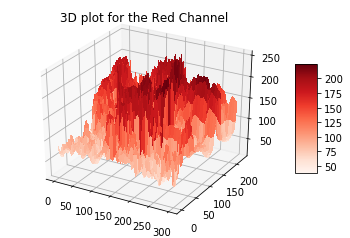

-60


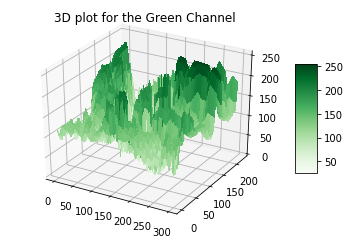

-60


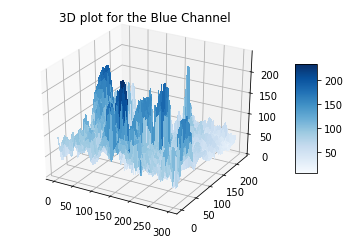

In [3]:
import numpy as np
from skimage.io import imread

def plot_3d(X, Y, Z, title, cmap):
    import matplotlib.pylab as plt
    from mpl_toolkits.mplot3d import Axes3D
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=0, antialiased=False)
    ax.set_title(title)
    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)
    print(ax.azim)    
    # print(ax.elevation)
    plt.show()
 
im = imread('parrot.jpg')
Y = np.arange(im.shape[0])
X = np.arange(im.shape[1])
X, Y = np.meshgrid(X, Y)
Z1 = im[...,0]
Z2 = im[...,1]
Z3 = im[...,2]
plot_3d(X, Y, Z1, cmap='Reds', title='3D plot for the Red Channel')
plot_3d(X, Y, Z2, cmap='Greens', title='3D plot for the Green Channel')
plot_3d(X, Y, Z3, cmap='Blues', title='3D plot for the Blue Channel')

# Wave Transform

(225, 300)
(225, 300)
(225, 300)


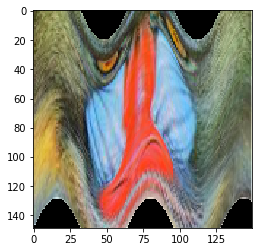

In [21]:
def wave(xy):
    xy[:, 1] += 20*np.sin(2*np.pi*xy[:, 0]/64)
    return xy
 
from skimage.io import imread
from skimage.transform import warp
import matplotlib.pylab as plt
im = imread('mandrill.jpg')
im = warp(im, wave)
plt.imshow(im)
plt.show()

# Swirl Transform

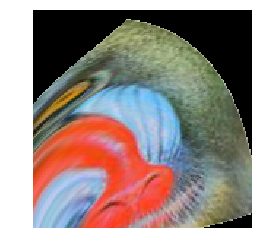

In [24]:
def swirl(xy, x0, y0, R):
    r = np.sqrt((xy[:,1]-x0)**2 + (xy[:,0]-y0)**2)
    a = np.pi * r / R
    xy[:, 1] = (xy[:, 1]-x0)*np.cos(a) + (xy[:, 0]-y0)*np.sin(a) + x0
    xy[:, 0] = -(xy[:, 1]-x0)*np.sin(a) + (xy[:, 0]-y0)*np.cos(a) + y0
    return xy
 
im = imread('mandrill.jpg')
im = warp(im, swirl, map_args={'x0':112, 'y0':112, 'R':512})
plt.imshow(im)
plt.axis('off')
plt.show()

D:\Programmes\Developpement\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


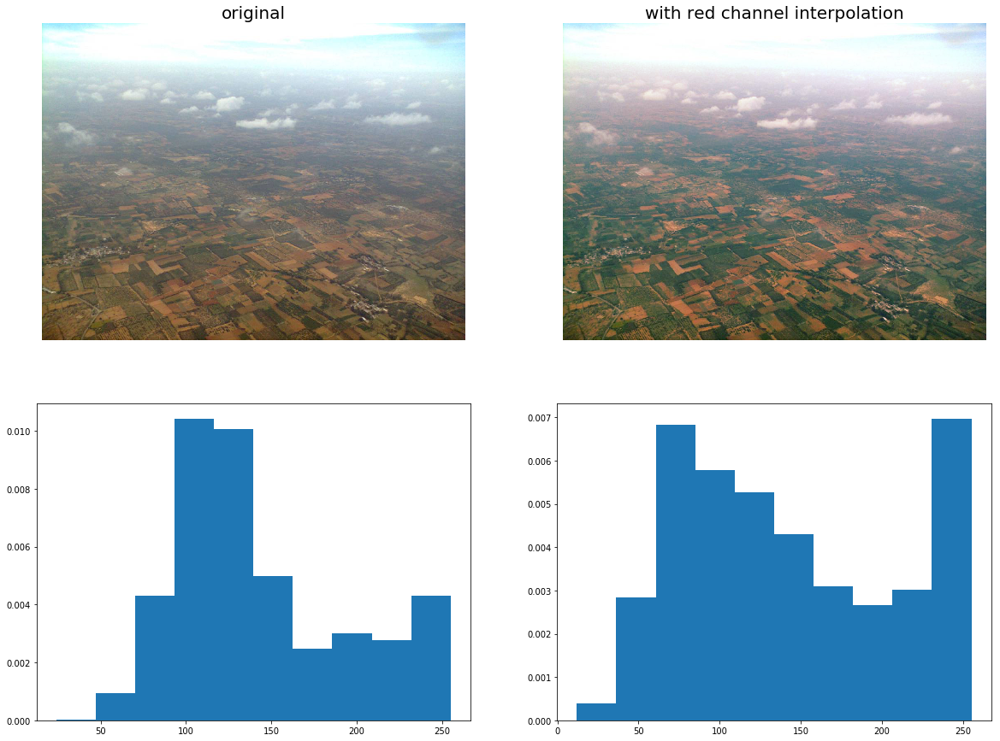

In [27]:
from PIL import Image
import numpy as np
import matplotlib.pylab as plt
im = Image.open('city2.jpg') # pixel values in [0,255]
r, g, b = im.split()
red_levels = [0., 12.75, 25.5, 51., 76.5, 127.5, 178.5, 204., 229.5, 242.25, 255.]
r1 = Image.fromarray((np.reshape(np.interp(np.array(r).ravel(), np.linspace(0,255,len(red_levels)), red_levels), (im.height, im.width))).astype(np.uint8), 
                     mode='L')
plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(222)
im1 = Image.merge('RGB', (r1, g, b))
plt.imshow(im1)
plt.axis('off')
plt.title('with red channel interpolation', size=20)
plt.subplot(223)
plt.hist(np.array(r).ravel(), normed=True)
plt.subplot(224)
plt.hist(np.array(r1).ravel(), normed=True)
plt.show()

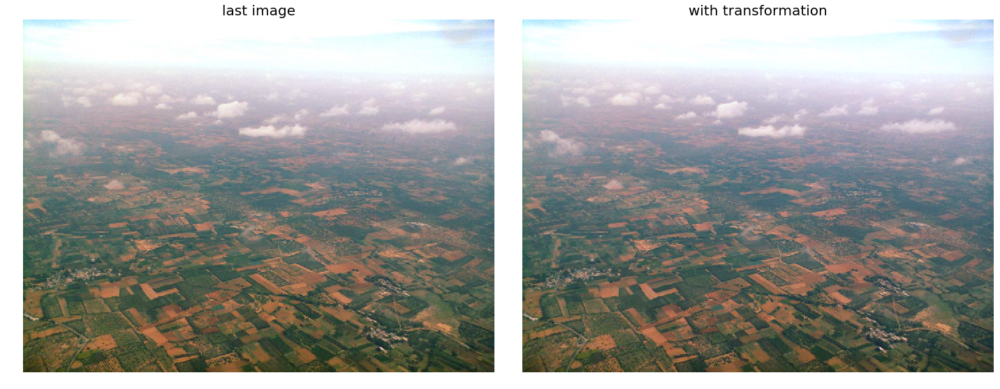

In [28]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(im1)
plt.title('last image', size=20)
plt.axis('off')
b1 = Image.fromarray(np.clip(np.array(b) + 7.65, 0, 255).astype(np.uint8))
im1 = Image.merge('RGB', (r1, g, b1))
plt.subplot(122)
plt.imshow(im1)
plt.axis('off')
plt.title('with transformation', size=20)
plt.tight_layout()
plt.show()

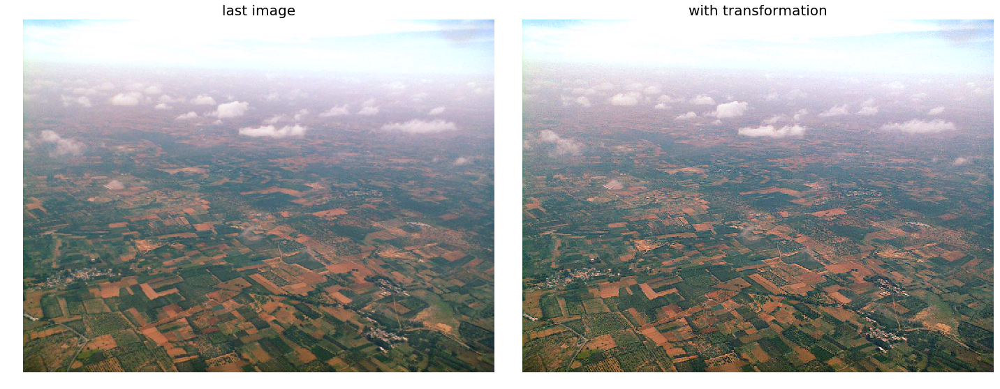

In [29]:
from PIL.ImageEnhance import Sharpness
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(im1)
plt.title('last image', size=20)
plt.axis('off')
im2 = Sharpness(im1).enhance(3.0)
plt.subplot(122)
plt.imshow(im2)
plt.axis('off')
plt.title('with transformation', size=20)
plt.tight_layout()
plt.show()

D:\Programmes\Developpement\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


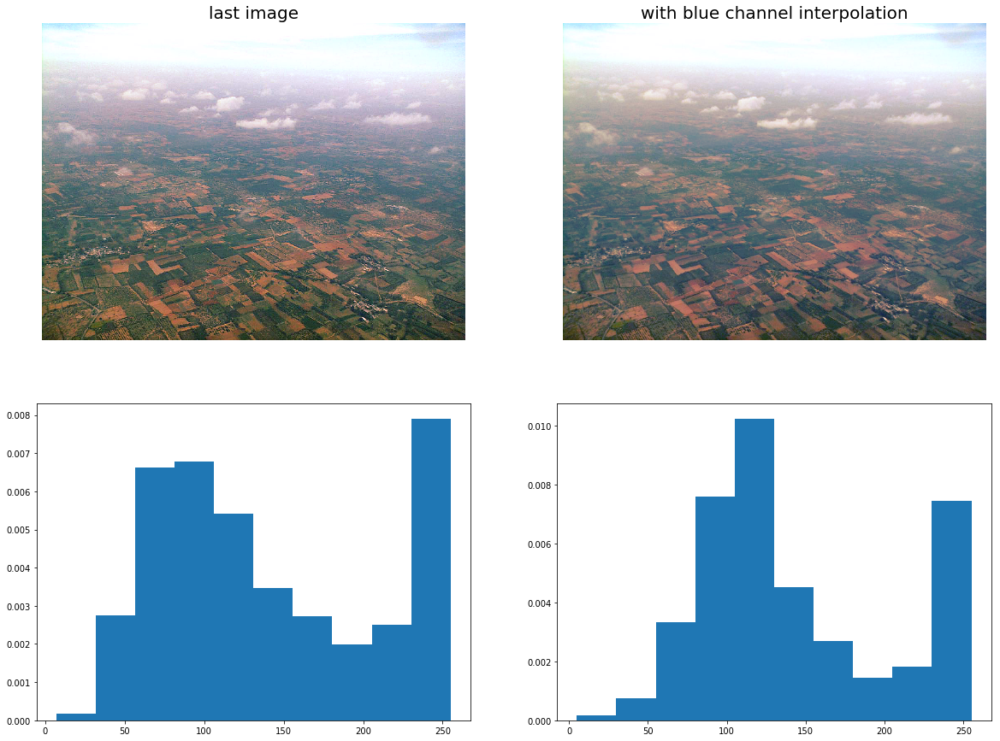

In [30]:
blue_levels = [0., 11.985, 30.09, 64.005, 81.09, 99.96, 107.1, 111.945, 121.125, 143.055, 147.9, 159.885, 171.105, 186.915, 215.985, 235.875, 255.]
b2 = Image.fromarray((np.reshape(np.interp(np.array(b1).ravel(), np.linspace(0,255,len(blue_levels)), blue_levels), (im.height, im.width))).astype(np.uint8), mode='L')
plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(im2)
plt.title('last image', size=20)
plt.axis('off')
plt.subplot(222)
im3 = Image.merge('RGB', (r1, g, b2))
plt.imshow(im3)
plt.axis('off')
plt.title('with blue channel interpolation', size=20)
plt.subplot(223)
plt.hist(np.array(b1).ravel(), normed=True)
plt.subplot(224)
plt.hist(np.array(b2).ravel(), normed=True)
plt.show()

(689, 1024)


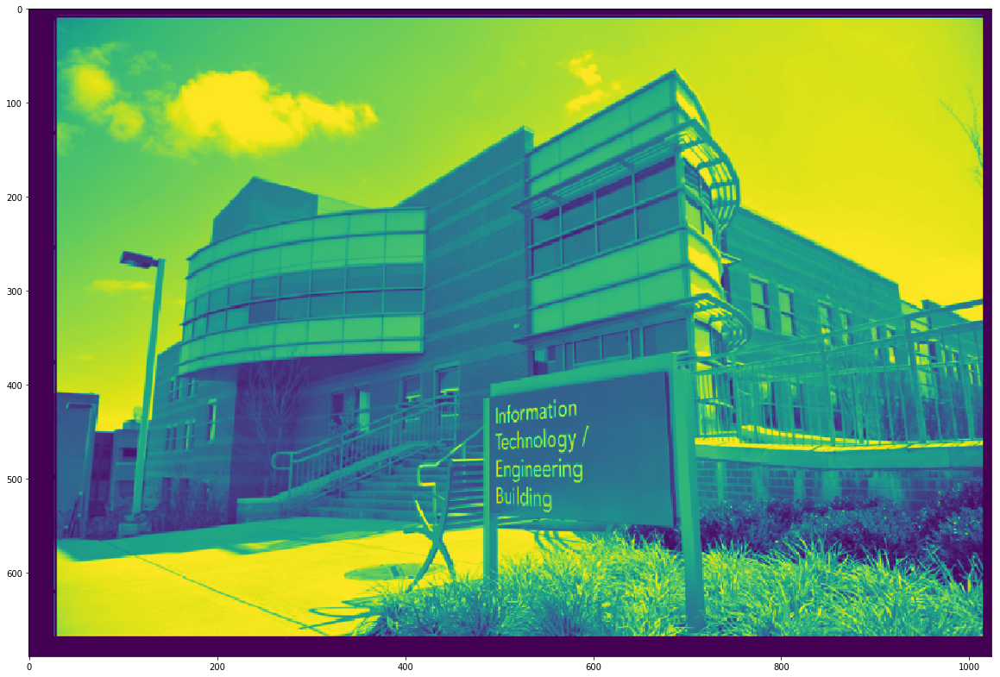

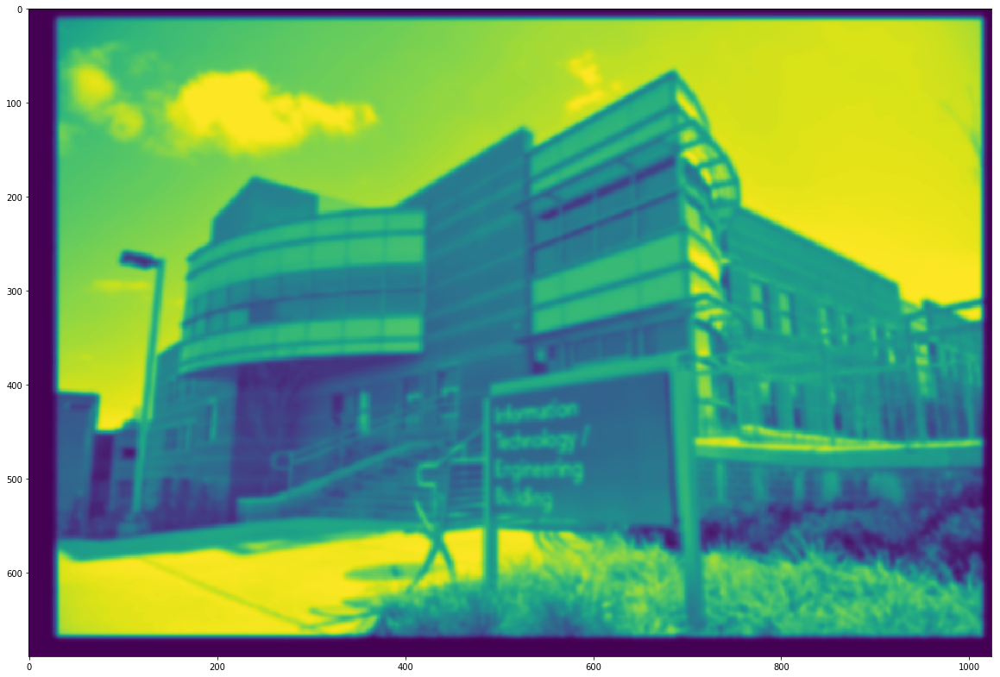

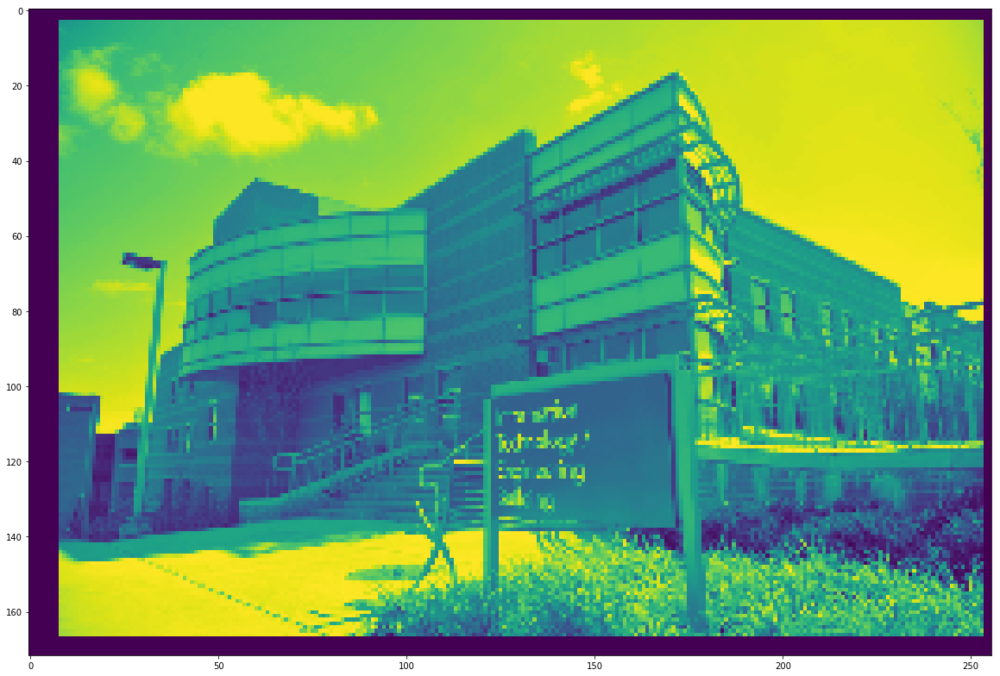

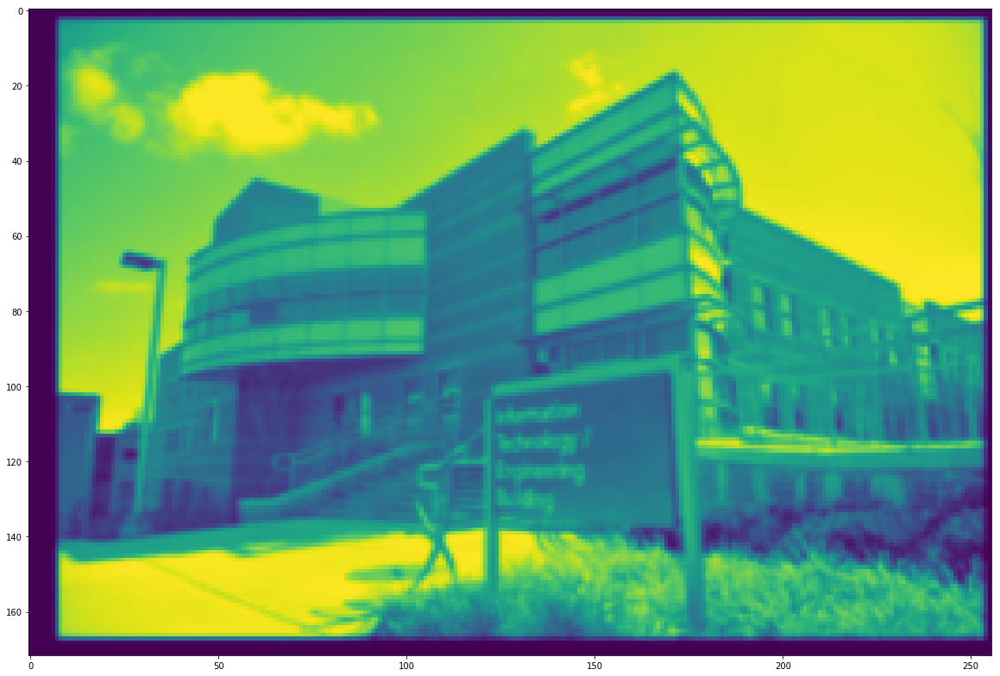

In [36]:
from skimage import color
from scipy.ndimage import gaussian_filter
im = color.rgb2gray(imread('orig_umbc.png'))
print(im.shape)
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.show()
plt.figure(figsize=(20,20))
im_blurred = gaussian_filter(im, sigma=2.5) #(5,5,1)
plt.imshow(im_blurred)
plt.show()
n = 4 # create and image 16 times smaller in size
w, h = im.shape[0] // n, im.shape[1] // n
im_small = np.zeros((w,h))
for i in range(w):
   for j in range(h):
      im_small[i,j] = im[n*i, n*j]
plt.figure(figsize=(20,20))
plt.imshow(im_small)
plt.show()
im_small = np.zeros((w,h))
for i in range(w):
   for j in range(h):
      im_small[i,j] = im_blurred[n*i, n*j]
plt.figure(figsize=(20,20))
plt.imshow(im_small)
plt.show()

(512, 512) (1024, 1024)
(1024, 1024)


D:\Programmes\Developpement\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: ComplexWarning: Casting complex values to real discards the imaginary part
D:\Programmes\Developpement\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: ComplexWarning: Casting complex values to real discards the imaginary part


D:\Programmes\Developpement\Anaconda3\lib\site-packages\ipykernel_launcher.py:45: ComplexWarning: Casting complex values to real discards the imaginary part
D:\Programmes\Developpement\Anaconda3\lib\site-packages\ipykernel_launcher.py:48: ComplexWarning: Casting complex values to real discards the imaginary part


-60


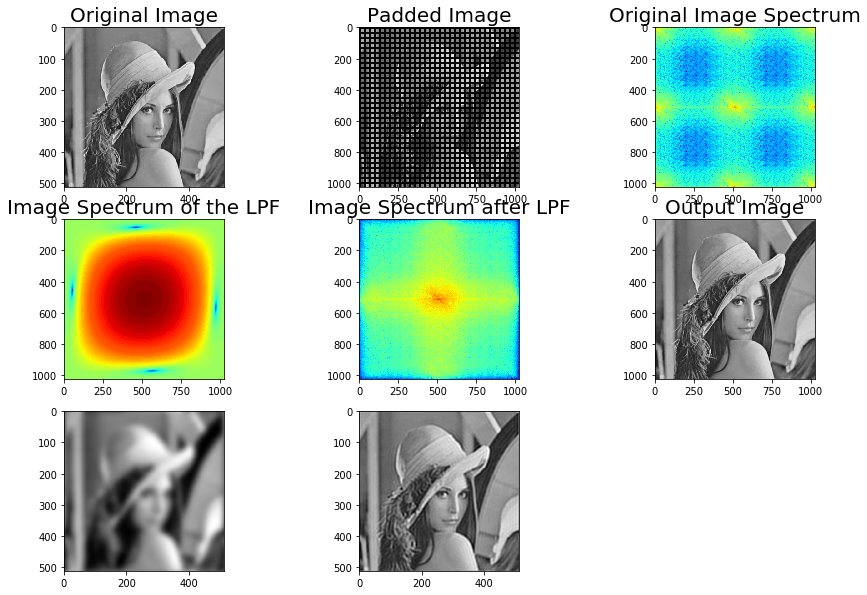

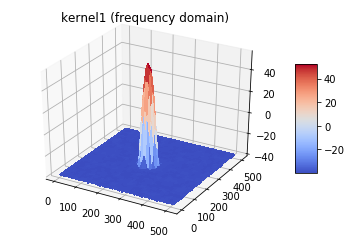

-60


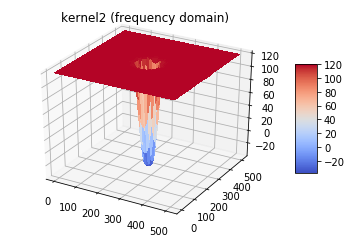

In [33]:
import numpy as np
import numpy.fft as fp
import matplotlib.pyplot as plt
 
im = np.mean(imread('lena15.jpg'), axis=2)
im1 = np.zeros((2*im.shape[0], 2*im.shape[1]))
print(im.shape, im1.shape)
for i in range(im.shape[0]):
    for j in range(im.shape[1]):
        im1[2*i,2*j] = im[i,j]
 
def padwithzeros(vector, pad_width, iaxis, kwargs):
    vector[:pad_width[0]] = 0
    vector[-pad_width[1]:] = 0
    return vector
 
# the LPF kernel
kernel = [[0.25, 0.5, 0.25], [0.5, 1, 0.5], [0.25, 0.5, 0.25]]
# enlarge the kernel to the shape of the image
kernel = np.pad(kernel, (((im1.shape[0]-3)//2,(im1.shape[0]-3)//2+1), ((im1.shape[1]-3)//2,(im1.shape[1]-3)//2+1)), padwithzeros)
print(kernel.shape)
 
plt.figure(figsize=(15,10))
plt.gray() # show the filtered result in grayscale
 
freq = fp.fft2(im1)
freq_kernel = fp.fft2(fp.ifftshift(kernel))
freq_LPF = freq*freq_kernel # by the Convolution theorem
im2 = fp.ifft2(freq_LPF)
freq_im2 = fp.fft2(im2)
 
plt.subplot(3,3,1)
plt.imshow(im)
plt.title('Original Image', size=20)
plt.subplot(3,3,2)
plt.imshow(im1)
plt.title('Padded Image', size=20)
plt.subplot(3,3,3)
plt.imshow( (20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), cmap='jet')
plt.title('Original Image Spectrum', size=20)
plt.subplot(3,3,4)
plt.imshow( (20*np.log10( 0.1 + fp.fftshift(freq_kernel))).astype(int), cmap='jet')
plt.title('Image Spectrum of the LPF', size=20)
plt.subplot(3,3,5)
plt.imshow( (20*np.log10( 0.1 + fp.fftshift(freq_im2))).astype(int), cmap='jet')
plt.title('Image Spectrum after LPF', size=20)
plt.subplot(3,3,6)
plt.imshow(im2.astype(np.uint8)) # the imaginary part is an artifact
plt.title('Output Image', size=20)

# create a blur kernel
kernel1 = np.outer(signal.gaussian(im.shape[0], 10), signal.gaussian(im.shape[1], 10))
freq = fp.fft2(im)
freq_kernel1 = fp.fft2(fp.ifftshift(kernel1))
convolved = freq*freq_kernel1 # by the Convolution theorem
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur)
plt.subplot(3,3,7)
plt.imshow(im_blur)

epsilon = 10**-6
freq_kernel2 = 1 / (epsilon + freq_kernel1)
freq_blur = fp.fft2(im_blur)
convolved2 = freq_blur*freq_kernel2
im_restored = fp.ifft2(convolved2).real
im_restored = im_restored / np.max(im_restored)
plt.subplot(3,3,8)
plt.imshow(im_restored)

Y = np.arange(im.shape[0])
X = np.arange(im.shape[1])
X, Y = np.meshgrid(X, Y)
Z1 = (20*np.log10( 0.01 + fp.fftshift(freq_kernel1))).real.astype(int)
plot_3d(X, Y, Z1, cmap='coolwarm', title='kernel1 (frequency domain)')
Z2 = (20*np.log10( 0.01 + fp.fftshift(freq_kernel2))).real.astype(int)
plot_3d(X, Y, Z2, cmap='coolwarm', title='kernel2 (frequency domain)')

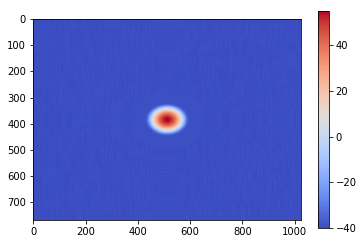

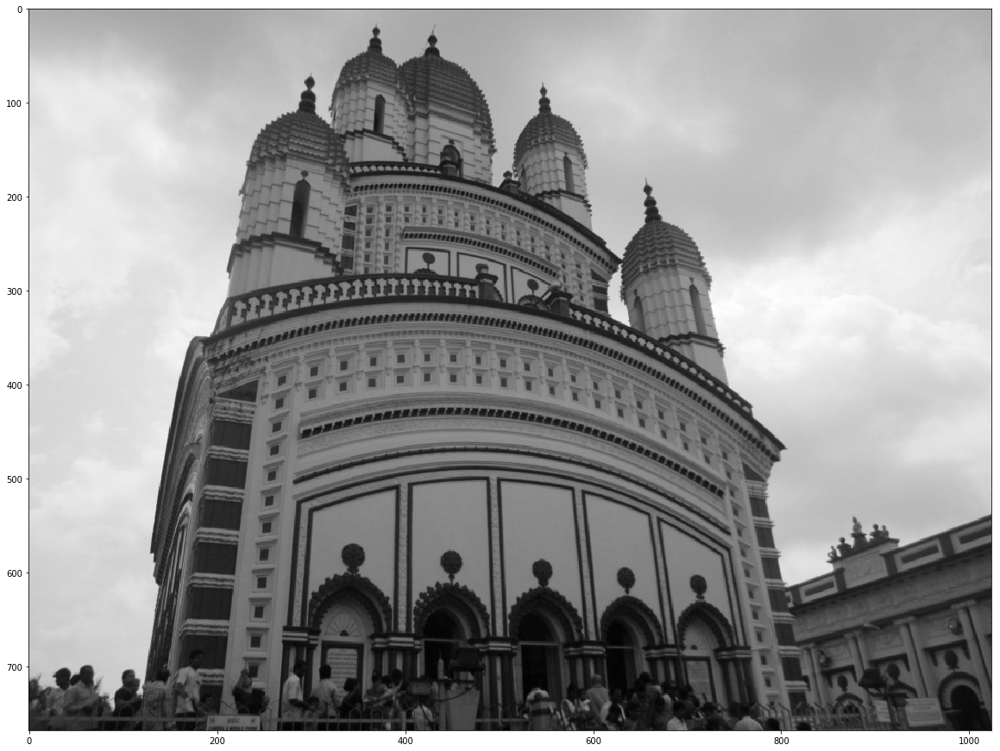

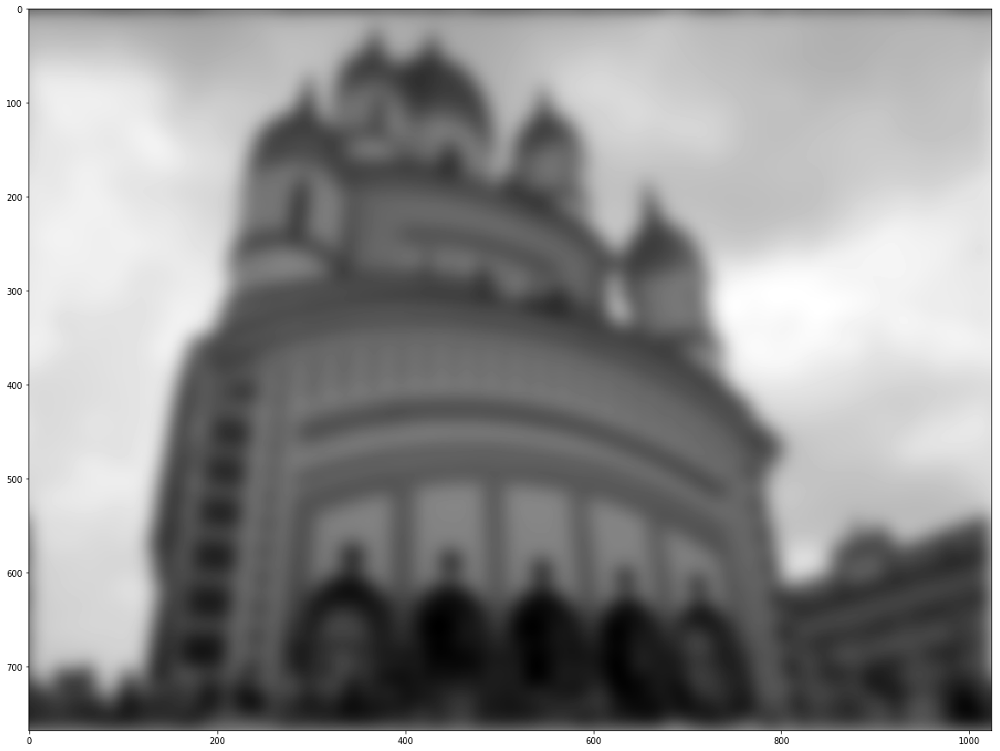

-60


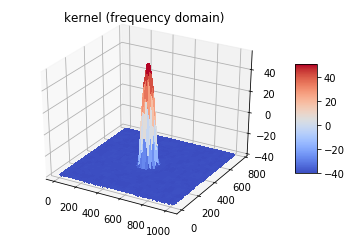

-60


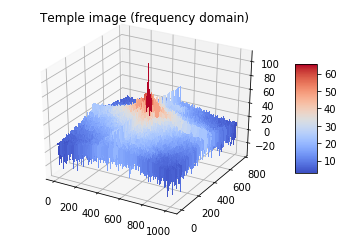

In [9]:
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.color import rgb2gray
from skimage.io import imread
import scipy.fftpack as fp
import scipy.signal as signal
 
im = rgb2gray(imread('temple.jpg'))
kernel = np.outer(signal.gaussian(im.shape[0], 10), signal.gaussian(im.shape[1], 10))
freq = fp.fft2(im)
assert(freq.shape == kernel.shape)
freq_kernel = fp.fft2(fp.ifftshift(kernel))
convolved = freq*freq_kernel # by the Convolution theorem
im_blur = fp.ifft2(convolved).real
im_blur = 255 * im_blur / np.max(im_blur)
 
# center the frequency response
plt.imshow( (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real.astype(int), cmap='coolwarm')
plt.colorbar()
plt.show()
 
plt.figure(figsize=(20,20))
plt.imshow(im, cmap='gray')
plt.show()

plt.figure(figsize=(20,20))
plt.imshow(im_blur, cmap='gray')
plt.show()

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import LinearLocator, FormatStrFormatter

Y = np.arange(im.shape[0])
X = np.arange(im.shape[1])
X, Y = np.meshgrid(X, Y)
Z1 = (20*np.log10( 0.01 + fp.fftshift(freq_kernel))).real.astype(int)
plot_3d(X, Y, Z1, cmap='coolwarm', title='kernel (frequency domain)')
Z2 = (20*np.log10( 0.01 + fp.fftshift(freq))).real.astype(int)
plot_3d(X, Y, Z2, cmap='coolwarm', title='Temple image (frequency domain)')

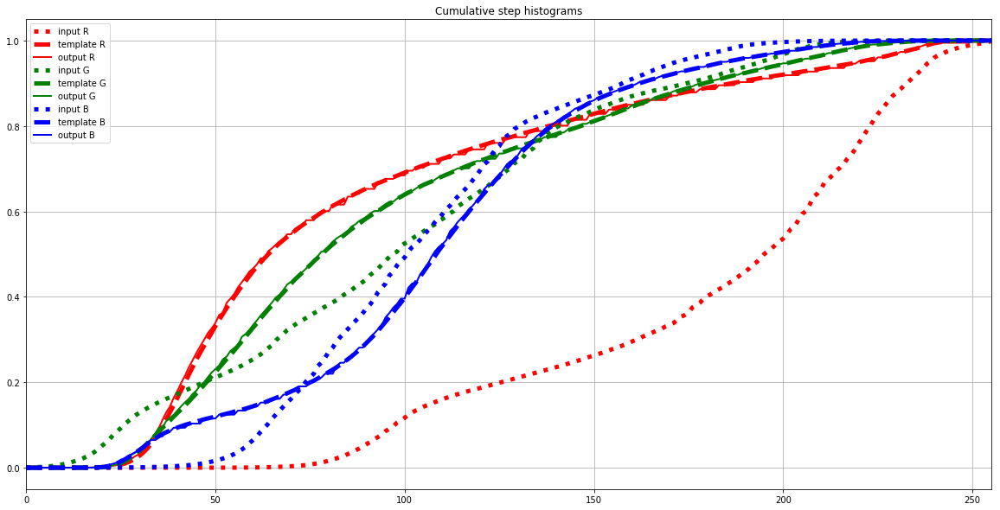

In [129]:
import numpy as np
from skimage.io import imread
import matplotlib.pyplot as plt


def calc_cdf(mat):
    cdf = np.zeros(256)
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            cdf[mat[i][j]] += 1        
    
    for i in range(1, 256):
        cdf[i] += cdf[i - 1]

    cdf = cdf/cdf[255]
    return cdf

def hist_matching(cdf_source, cdf_target, mat_source):    
    map = np.linspace(0,255,256)
    for i in range(cdf_source.shape[0]):
        for j in range(cdf_target.shape[0]):
            if cdf_source[i] > cdf_target[j] :                
                map[i] = j        
                continue
            
    mat_cible = mat_source
    for i in range(mat_source.shape[0]):
        for j in range(mat_source.shape[1]):
            mat_cible[i][j] = map[mat_source[i][j]]
    return mat_cible


im = imread('lena15.jpg')
im_t = imread('vstyle.png')
im1 = np.zeros(im.shape).astype(np.uint8)

fig, ax = plt.subplots(figsize=(20, 10))

for i in range(3):    
    col = 'r' if i == 0 else ('g' if i == 1 else 'b')
    label = 'red' if i == 0 else ('green' if i == 1 else 'blue')
    c = calc_cdf(im[..., i])
    c_t = calc_cdf(im_t[..., i])    
    im1[...,i] = hist_matching(c, c_t, im[...,i]) # implement this function with the above algorithm
    c1 = calc_cdf(im1[...,i])
    ax.plot(np.arange(256), c, col + ':', label='input ' + col.upper(), linewidth=5)
    ax.plot(np.arange(256), c_t, col + '--', label='template ' + col.upper(), linewidth=5)
    ax.plot(np.arange(256), c1, col + '-', label='output ' + col.upper(), linewidth=2)
    
# tidy up the figure
ax.grid(True)
ax.legend(loc='upper left')
ax.set_xlim(0, 255)
ax.set_title('Cumulative step histograms')
plt.show()

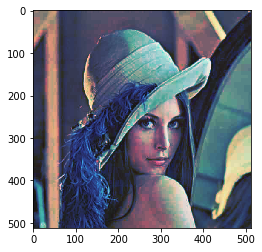

In [130]:
plt.imshow(im1)
plt.show()

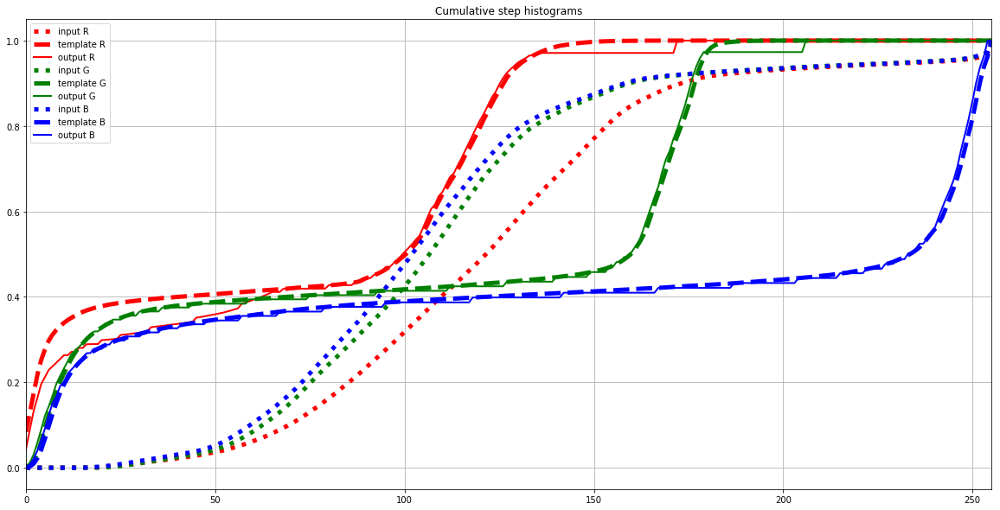

In [131]:
im = imread('me1.jpg')
im_t = imread('treebirds.jpg')
im1 = np.zeros(im.shape).astype(np.uint8)

fig, ax = plt.subplots(figsize=(20, 10))

for i in range(3):    
    col = 'r' if i == 0 else ('g' if i == 1 else 'b')
    label = 'red' if i == 0 else ('green' if i == 1 else 'blue')
    c = calc_cdf(im[..., i])
    c_t = calc_cdf(im_t[..., i])    
    im1[...,i] = hist_matching(c, c_t, im[...,i]) # implement this function with the above algorithm
    c1 = calc_cdf(im1[...,i])
    ax.plot(np.arange(256), c, col + ':', label='input ' + col.upper(), linewidth=5)
    ax.plot(np.arange(256), c_t, col + '--', label='template ' + col.upper(), linewidth=5)
    ax.plot(np.arange(256), c1, col + '-', label='output ' + col.upper(), linewidth=2)
    
# tidy up the figure
ax.grid(True)
ax.legend(loc='upper left')
ax.set_xlim(0, 255)
ax.set_title('Cumulative step histograms')
plt.show()

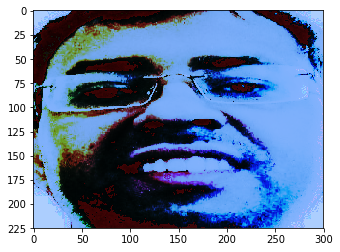

In [132]:
plt.imshow(im1)
plt.show()

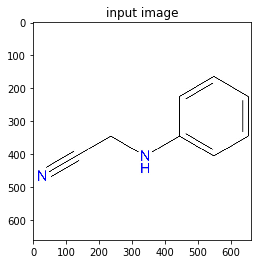

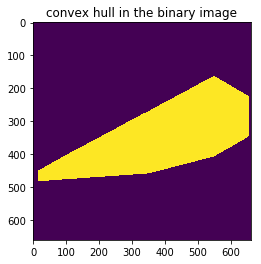

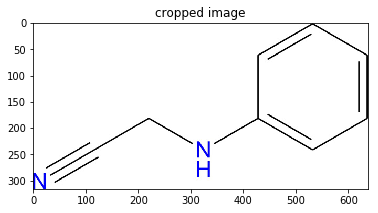

In [138]:
from PIL import Image
from skimage.io import imread
from skimage.morphology import convex_hull_image
from skimage.color import rgb2gray
im = imread('L_2d.jpg')
plt.imshow(im)
plt.title('input image')
plt.show()
im1 = 1 - rgb2gray(im)
threshold = 0.5
im1[im1 > threshold] = 1
chull = convex_hull_image(im1)
plt.imshow(chull)
plt.title('convex hull in the binary image')
plt.show()
imageBox = Image.fromarray((chull*255).astype(np.uint8)).getbbox()
cropped = Image.fromarray(im).crop(imageBox)
cropped.save('L_2d_cropped.jpg')
plt.imshow(cropped)
plt.title('cropped image')
plt.show()

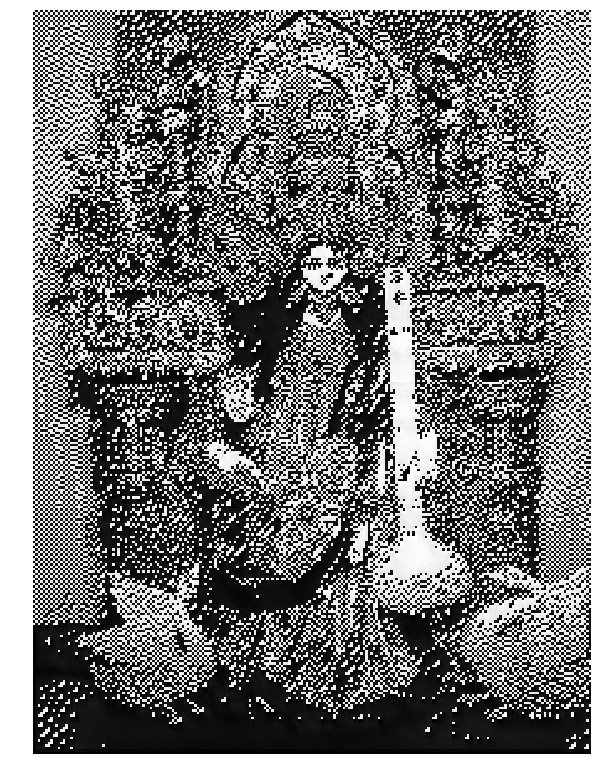

In [145]:
from skimage.color import rgb2gray

def find_closest_palette_color(oldpixel):
    return int(round(oldpixel / 255)*255)
 
im = imread('godess_gray.jpg')
pixel = np.copy(im)
w, h = im.shape
 
for x in range(w):
    for y in range(h):
        oldpixel = pixel[x][y]
        newpixel = find_closest_palette_color(oldpixel)
        pixel[x][y] = newpixel
        quant_error = oldpixel - newpixel
        if x + 1 < w-1:
          pixel[x + 1][y] = pixel[x + 1][y] + quant_error * 7 / 16
        if x > 0 and y < h-1:
           pixel[x - 1][y + 1] = pixel[x - 1][y + 1] + quant_error * 3 / 16
        if y < h-1:
           pixel[x ][y + 1] = pixel[x ][y + 1] + quant_error * 5 / 16
        if x < w-1 and y < h-1:
           pixel[x + 1][y + 1] = pixel[x + 1][y + 1] + quant_error * 1 / 16
 
plt.figure(figsize=(10,20))
plt.imshow(pixel, cmap='gray')
plt.axis('off')
plt.show()

In [10]:
from scipy import ndimage, misc
import matplotlib.pyplot as plt
from scipy.misc import imread
from skimage.color import rgb2gray
 
img = rgb2gray(imread('zebras.jpg'))
 
fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
 
 
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    plt.imshow(result)
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=30)
 
plt.tight_layout()
plt.show()

D:\Programmes\Developpement\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


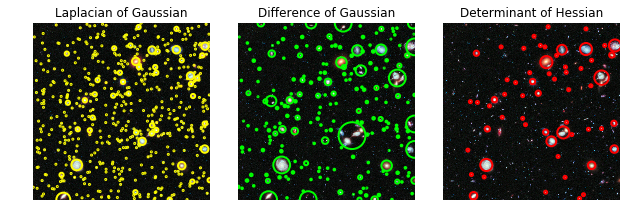

In [5]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray

import matplotlib.pyplot as plt


image = data.hubble_deep_field()[0:500, 0:500]
image_gray = rgb2gray(image)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

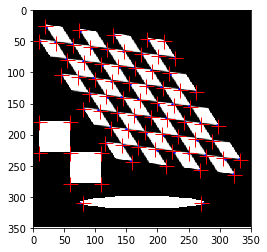

In [8]:
from matplotlib import pyplot as plt

from skimage import data
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.transform import warp, AffineTransform
from skimage.draw import ellipse


tform = AffineTransform(scale=(1.3, 1.1), rotation=1, shear=0.7,
                        translation=(210, 50))
image = warp(data.checkerboard(), tform.inverse, output_shape=(350, 350))
rr, cc = ellipse(310, 175, 10, 100)
image[rr, cc] = 1
image[180:230, 10:60] = 1
image[230:280, 60:110] = 1

coords = corner_peaks(corner_harris(image), min_distance=5)
coords_subpix = corner_subpix(image, coords, window_size=13)

fig, ax = plt.subplots()
ax.imshow(image, interpolation='nearest', cmap=plt.cm.gray)
ax.plot(coords[:, 1], coords[:, 0], '.b', markersize=3)
ax.plot(coords_subpix[:, 1], coords_subpix[:, 0], '+r', markersize=15)
ax.axis((0, 350, 350, 0))
plt.show()

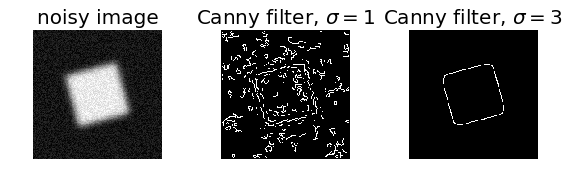

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import feature


# Generate noisy image of a square
im = np.zeros((128, 128))
im[32:-32, 32:-32] = 1

im = ndi.rotate(im, 15, mode='constant')
im = ndi.gaussian_filter(im, 4)
im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

D:\Programmes\Developpement\Anaconda3\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


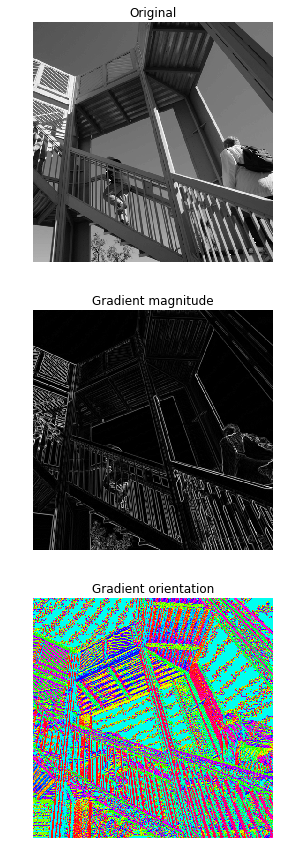

In [2]:
import numpy as np
from scipy import signal
from scipy import misc
import matplotlib.pyplot as plt
ascent = misc.ascent()
scharr = np.array([[ -3-3j, 0-10j,  +3 -3j],
                  [-10+0j, 0+ 0j, +10 +0j],
                   [ -3+3j, 0+10j,  +3 +3j]]) # Gx + j*Gy
grad = signal.convolve2d(ascent, scharr, boundary='symm', mode='same')


fig, (ax_orig, ax_mag, ax_ang) = plt.subplots(3, 1, figsize=(6, 15))
ax_orig.imshow(ascent, cmap='gray')
ax_orig.set_title('Original')
ax_orig.set_axis_off()
ax_mag.imshow(np.absolute(grad), cmap='gray')
ax_mag.set_title('Gradient magnitude')
ax_mag.set_axis_off()
ax_ang.imshow(np.angle(grad), cmap='hsv') # hsv is cyclic, like angles
ax_ang.set_title('Gradient orientation')
ax_ang.set_axis_off()
fig.show()

estimated noise standard deviation = 0.07833747315421268


ValueError: Input images must have the same dtype.

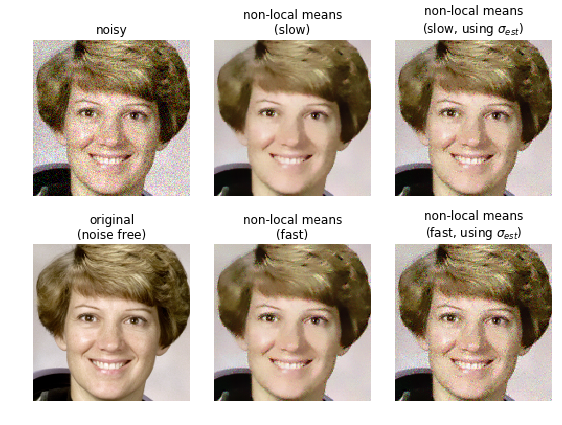

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.measure import compare_psnr


astro = img_as_float(data.astronaut())
astro = astro[30:180, 150:300]

sigma = 0.08
noisy = astro + sigma * np.random.standard_normal(astro.shape)
noisy = np.clip(noisy, 0, 1)

# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))

patch_kw = dict(patch_size=5,      # 5x5 patches
                patch_distance=6,  # 13x13 search area
                multichannel=True)

# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False,
                           **patch_kw)

# slow algorithm, sigma provided
denoise2 = denoise_nl_means(noisy, h=0.8 * sigma_est,
                            fast_mode=False, **patch_kw)

# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True,
                                **patch_kw)

# fast algorithm, sigma provided
denoise2_fast = denoise_nl_means(noisy, h=0.6 * sigma_est, 
                                 fast_mode=True, **patch_kw)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(8, 6),
                       sharex=True, sharey=True)

ax[0, 0].imshow(noisy)
ax[0, 0].axis('off')
ax[0, 0].set_title('noisy')
ax[0, 1].imshow(denoise)
ax[0, 1].axis('off')
ax[0, 1].set_title('non-local means\n(slow)')
ax[0, 2].imshow(denoise2)
ax[0, 2].axis('off')
ax[0, 2].set_title('non-local means\n(slow, using $\sigma_{est}$)')
ax[1, 0].imshow(astro)
ax[1, 0].axis('off')
ax[1, 0].set_title('original\n(noise free)')
ax[1, 1].imshow(denoise_fast)
ax[1, 1].axis('off')
ax[1, 1].set_title('non-local means\n(fast)')
ax[1, 2].imshow(denoise2_fast)
ax[1, 2].axis('off')
ax[1, 2].set_title('non-local means\n(fast, using $\sigma_{est}$)')

fig.tight_layout()

# print PSNR metric for each case
psnr_noisy = compare_psnr(astro, noisy)
psnr = compare_psnr(astro, denoise)
psnr2 = compare_psnr(astro, denoise2)
psnr_fast = compare_psnr(astro, denoise_fast)
psnr2_fast = compare_psnr(astro, denoise2_fast)

print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (slow, using sigma) = {:0.2f}".format(psnr2))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
print("PSNR (fast, using sigma) = {:0.2f}".format(psnr2_fast))

plt.show()